# **<h3 align="center">Machine Learning II</h3>**
**Group members:**<br>Alexandra Pinto - 20211599@novaims.unl.pt - 20211599<br>
Ilona Nacu  - 20211602@novaims.unl.pt - 20211602<br>
Rafael Proença  - 20211681@novaims.unl.pt - 20211681<br>


# Table of Contents
* [1. Import the Libraries](#chapter1)
* [2. Import the Dataset](#chapter2)
* [3. Description of the Dataset’s Structure](#chapter3)
* [4. Exploring the Dataset](#chapter4)
    * [4.1. Identification and Treatment of Possible Data Inconsistencies](#section_4_1)
        * [4.1.1. Duplicates](#sub_section_4_1_1)
        * [4.1.2. Constant Feature](#sub_section_4_1_2)
        * [4.1.3. Missing Values](#sub_section_4_1_3)
    * [4.2. Features’ Transformation](#section_4_2)
        * [4.2.1. Age Feature](#sub_section_4_2_1)
        * [4.2.2. CustomerFrom Feature](##sub_section_4_2_2)
        * [4.2.3. Gender Feature](#sub_section_4_2_3)
        * [4.2.4. Education Feature](#sub_section_4_2_4)
        * [4.2.5. Children Feature](#sub_section_4_2_5)
        * [4.2.6. Lifetime spend total feature](#sub_section_4_2_6)
    * [4.3. Dataset based on Geographical Distribution](#section_4_3)
        * [4.3.1. Supermarket Cluster](#sub_section_4_3_1)
    * [4.4. Outliers](#section_4_4)
    * [4.5. Correlation Matrix](#section_4_5)
    * [4.6. Final Features](#section_4_6)
        * [4.6.1. Feature's classification](#sub_section_4_6_1)
        * [4.6.2. Final dataset](#sub_section_4_6_1)
* [5. Clustering Algorithms](#chapter5)
    * [5.1. Scaling the data](#section_5_1)
    * [5.2. K-Means](#section_5_2)
* [6. Multidimensionality Visualization](#chapter6)
    * [6.1. T-SNE](#section_6_2)
    * [6.2. UMAP](#section_6_3)
* [7. Association Rules](#chapter7)
    * [7.1.  Exploring Cluster Profiles ](#section_7_1)
    * [7.2.  Association Rules ](#section_7_2)
        * [7.2.1. Students](#sub_section_7_2_1)
        * [7.2.2. Loyal Grocery Shoppers](#sub_section_7_2_2)
        * [7.2.3. Vegetarian Family](#sub_section_7_2_3)
        * [7.2.4. Tech Enthusiasts](#sub_section_7_2_4)
        * [7.2.5. Family Shoppers](#sub_section_7_2_5)
        * [7.2.6. Promotion Hunters](#sub_section_7_2_6)
        * [7.2.7. Casual Shoppers](#sub_section_7_2_7)  
        * [7.2.8. Young Educated Moderate]((#sub_section_7_2_8)
        * [7.2.9. Wholesale Meat and Seafood Distributors](#sub_section_7_2_9)
    * [7.3. Geographical Distribution of Clusters](#section_7_3)
* [8. Conclusion](#chapter8)



# 1. Import the Libraries <a class="anchor" id="chapter1"></a> 

For tasks involving data manipulation, numerical calculations, visualization, and machine learning, imports of libraries like the mentioned in the below cell are crucial. These libraries offer the required functions and tools for preprocessing data, pattern analysis, consumer segmentation, and development of focused marketing campaigns.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import umap
import umap.umap_ as umap

import ast
from utils import missing_reporter #imported from the utils python file and will be used in 4.1.3.Missing Values
from utils import correlation_heatmap #imported from the utils python file and will be used in 4.5. Correlation Matrix
from utils import compute_silhouette_scores  #imported from the utils python file and will be used in 5.2. K-Means
from utils import visualize_dimensionality_reduction #imported from the utils python file and will be used in 6.1.T-SNE and 6.2. UMAP
from utils import calculate_cluster_statistics #imported from the utils python file and will be used in 7.1. Exploring Cluster Profiles  
from utils import create_cluster_dataframes #imported from the utils python file and will be used in 7.2. Association Rules
from utils import generate_association_rules #imported from the utils python file and will be used in 7.2. Association Rules

from pylab import rcParams
rcParams['figure.figsize'] = 15, 10

import warnings

warnings.filterwarnings("ignore")  # There are some warnings in certain parts of the code which we do not need to have displayed

# 2. Import the Dataset <a class="anchor" id="chapter2"></a>

In this section, we import the different datasets and set the customer_id as the index column in the "Customer Info Dataset" and "Product Mapping Excel File". We decided yet to not choose an index for the "Customer Basket Dataset" because we only use it when performing the Association Rules.<br>
A small note about "Product Mapping Excel File", this was used every time we needed to check what categorie is a determinated product, mostly on Association Rules.

In [2]:
customer_info = pd.read_csv('Customer Info Dataset.csv',index_col=0)
basket = pd.read_csv('Customer Basket Dataset.csv')
pod_map= pd.read_excel('Product Mapping Excel File.xlsx', index_col = 0)

# 3. Description of the Dataset’s Structure<a class="anchor" id="chapter3"></a>

The <span style='color:Blue'> info()  </span> method prints information about the DataFrame. Using this method we can also see that there are some missing values. For example, in column *loyalty_card_number*  there is 5825 Non-Null value, which means that 30000-5825 = 24175 NaN. In chapter **4.2. Feature's Transformation** we will treat these missing values.

In [3]:
customer_info.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 4239 to 2570
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customer_name                            30000 non-null  object 
 1   customer_gender                          30000 non-null  object 
 2   customer_birthdate                       30000 non-null  object 
 3   kids_home                                30000 non-null  float64
 4   teens_home                               30000 non-null  float64
 5   number_complaints                        30000 non-null  float64
 6   distinct_stores_visited                  30000 non-null  float64
 7   lifetime_spend_groceries                 30000 non-null  float64
 8   lifetime_spend_electronics               30000 non-null  float64
 9   typical_hour                             30000 non-null  float64
 10  lifetime_spend_vegetables                300

The <span style='color:Blue'> describe()  </span> method  is used for calculating some statistical data. The features: *customer_name*, *customer_gender*, and *customer_birthdate* don't have any statistical data since they're categorical features. <br> Using this method we can also see some "weird" values such as -inf in *typical_hour* and *lifetime_spend_videogames*. This case will be treated in the chapter named **4.3.1. Supermarket Cluster**.

In [4]:
customer_info.describe().T

,count,mean,std,min,25%,50%,75%,max
kids_home,30000.0,1.146700e+00,1.234111,0.000000e+00,0.000000,1.000000,1.000000,10.000000
teens_home,30000.0,5.129333e-01,0.912502,0.000000e+00,0.000000,0.000000,1.000000,9.000000
number_complaints,30000.0,7.643667e-01,0.836341,0.000000e+00,0.000000,1.000000,1.000000,9.000000
distinct_stores_visited,30000.0,6.120767e+00,6.511410,0.000000e+00,2.000000,3.000000,8.000000,21.000000
lifetime_spend_groceries,30000.0,3.978634e+03,5280.641466,0.000000e+00,220.000000,950.000000,5253.000000,18852.000000
lifetime_spend_electronics,30000.0,9.652388e+02,1755.323397,1.058527e+00,45.000000,194.000000,721.000000,6603.000000
typical_hour,30000.0,-inf,NaN,-inf,9.000000,14.000000,20.000000,23.000000
lifetime_spend_vegetables,30000.0,5.642078e+02,481.819086,1.000000e+00,247.000000,425.000000,785.000000,1568.000000
lifetime_spend_nonalcohol_drinks,30000.0,6.287501e+02,496.346400,0.000000e+00,244.000000,425.000000,949.000000,1671.000000
lifetime_spend_alcohol_drinks,30000.0,3.793445e+02,236.206400,0.000000e+00,193.000000,419.000000,537.000000,1048.000000


Separating the categorical features from the numerical, it is possible to use <span style='color:Blue'> describe()  </span> method to obtain some information about these variables.

In [5]:
columns = ['customer_name', 'customer_gender', 'customer_birthdate']
customer_info[columns].describe()

,customer_name,customer_gender,customer_birthdate
count,30000,30000,30000
unique,29443,2,29990
top,Robert Smith,male,09/27/1940 05:54 AM
freq,10,15090,2


To ensure data integrity by maintaining the integrity of the original data, reproducibility by enabling iterative analysis and validation of the transformations without changing the original data, it is necessary to make a copy of the original dataset before applying transformations, for that we use the <span style='color:Blue'> copy()  </span> method.

In [6]:
cust_info= customer_info.copy()

In [7]:
cust_info.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 4239 to 2570
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   customer_name                            30000 non-null  object 
 1   customer_gender                          30000 non-null  object 
 2   customer_birthdate                       30000 non-null  object 
 3   kids_home                                30000 non-null  float64
 4   teens_home                               30000 non-null  float64
 5   number_complaints                        30000 non-null  float64
 6   distinct_stores_visited                  30000 non-null  float64
 7   lifetime_spend_groceries                 30000 non-null  float64
 8   lifetime_spend_electronics               30000 non-null  float64
 9   typical_hour                             30000 non-null  float64
 10  lifetime_spend_vegetables                300

# 4. Exploring the Dataset <a class="anchor" id="chapter4"></a>

In  this chapter of the project we are focusing on exploring and preprocessing the dataset. <br>
It includes various steps such as identifying and treating possible data inconsistencies, transforming features, analyzing the dataset based on location, detecting and handling outliers and understand our features, examining the correlation matrix, and selecting the final features for the next steps.

## 4.1. Identification and Treatment of Possible Data Inconsistencies <a class="anchor" id="section_4_1"></a>

In this section we perform several checks and treatments to ensure data quality. <br>
This entails locating and managing duplicates to prevent redundant data, removing constant characteristics that don't offer insightful information, and dealing with missing values using methods like imputation or exclusion. These procedures are essential for preserving data integrity and enhancing the accuracy of later analysis and modeling efforts.

> ## 4.1.1. Duplicates <a class="anchor" id="sub_section_4_1_1"></a>

With the <span style='color:Blue'> drop_duplicates() </span> method the duplicates rows will be dropped. We can conclude that that this dataset does not have duplicates.

In [8]:
cust_info.shape #number of rows and columns before applyig the method

(30000, 23)

In [9]:
cust_info.drop_duplicates(inplace= True)
cust_info.shape

(30000, 23)

For the data set "Customer Basket Dataset" named basket, it was also very important to make sure that there wasn't any invoice_id duplicated. <br>
After use the <span style='color:Blue'> drop_duplicates() </span> method is was visible that there are some duplicates (80000-79749) = 251.

In [10]:
basket.shape #number of rows and columns before applyig the method

(80000, 3)

In [11]:
basket.drop_duplicates(subset='invoice_id',inplace= True)
basket.shape

(79749, 3)

> ## 4.1.2. Constant features <a class="anchor" id="sub_section_4_1_2"></a>

The <span style='color:Blue'> var() </span> method allows us to check if there are any of the numerical variables are univariate (variance is equal to 0).

In [12]:
cust_info.var()

kids_home                                  1.523030e+00
teens_home                                 8.326605e-01
number_complaints                          6.994669e-01
distinct_stores_visited                    4.239846e+01
lifetime_spend_groceries                   2.788517e+07
lifetime_spend_electronics                 3.081160e+06
typical_hour                                        NaN
lifetime_spend_vegetables                  2.321496e+05
lifetime_spend_nonalcohol_drinks           2.463597e+05
lifetime_spend_alcohol_drinks              5.579346e+04
lifetime_spend_meat                        3.311408e+05
lifetime_spend_fish                        9.219761e+06
lifetime_spend_hygiene                     2.840816e+04
lifetime_spend_videogames                           NaN
lifetime_total_distinct_products           2.027652e+06
percentage_of_products_bought_promotion    2.114188e-02
year_first_transaction                     2.492302e+01
loyalty_card_number                        8.363

> ## 4.1.3. Missing values <a class="anchor" id="sub_section_4_1_3"></a>

The <span style='color:Blue'> Missing_Reporter() </span> function present in utils.py, is an automated missing values reporter. <br>


In [13]:
missing_reporter(cust_info)

There are no missing values!


Now that we treated the dataset, we are able to perform **Features' Tranformation**

## 4.2. Features’ Transformation <a class="anchor" id="section_4_2"></a>

In this topic, we focus on creating new meaningful features for analysis, such age, loyalty card, gender, and others, based on the original features. <br>
Peforming **Features's Transformation** we acquire insights into the demographics, loyalty, and characteristics of our customers by translating raw data into these instructive aspects.

> ## 4.2.1. Age feature <a class="anchor" id="sub_section_4_2_1"></a>

Replacing the feature *customer_birthdate* with *age* in the present year makes the feature more readable and easy to evaluate. <br>
After creating this feature we eliminate *customer_birthdate* and *Birthyear*, that we created to help us to calculate the age.


In [14]:
cust_info['customer_birthdate'] = pd.to_datetime(cust_info['customer_birthdate'], format='%m/%d/%Y %I:%M %p')

In [15]:
cust_info['Birthyear'] = pd.to_datetime(cust_info['customer_birthdate']).dt.date

In [16]:
current_datetime = datetime.now()
today = current_datetime.date()

In [17]:
cust_info.insert(loc = 3, column = "age", value = (today - cust_info['Birthyear'])// pd.Timedelta(days=365.2425))
cust_info.drop('Birthyear', axis = 1, inplace = True)
cust_info.drop('customer_birthdate', axis = 1, inplace = True)

> ## 4.2.2. Loyalty Card feature <a class="anchor" id="sub_section_4_2_2"></a>

As we saw in  the previous Chapter the 'loyalty_card_number' feature has 24175 NaN. So we decided to create a new variable called *loyalty_card* which represents if the customer has a loyalty card,1 if yes and 0 otherwise. After that we eliminate *loyalty_card_number*.

In [18]:
cust_info['loyalty_card'] = np.where(cust_info['loyalty_card_number'].isna() | (cust_info['loyalty_card_number'] == ''), 0, 1)

In [19]:
cust_info.drop('loyalty_card_number', axis = 1, inplace = True)

> ## 4.2.3. Gender feature <a class="anchor" id="sub_section_4_2_3"></a>

Using the *customer_gender* we created a binary feature named *Male*. Naming the feature makes it easier to understand. If it's a male customer then the value is 1, 0 otherwise. <br>
Since we already have a new variable related to the gender we will eliminate the *customer_gender*.

In [20]:
cust_info['Male'] = np.where((cust_info['customer_gender'] == 'female'), 0, 1)
cust_info['Male'].value_counts()

1    15090
0    14910
Name: Male, dtype: int64

In [21]:
cust_info.drop('customer_gender', axis = 1, inplace = True)

> ## 4.2.4. Education feature <a class="anchor" id="sub_section_4_2_4"></a>

The education level was present in the customer name, so we decided to create a new feature called 'Education'. <br>
- Bsc corresponds to a bachelor degree. <br>
- Msc corresponds to a master degree. <br>
- Phd corresponds to a phd degree. <br>
- No higher Education corresponds to those who do not have any of the education degree above. <br>

To have clean data and avoid redundancy we also eliminate the education level present in "customer_name".

In [22]:
for i in range(1,len(cust_info)+1):
    customer_name = cust_info.loc[i, 'customer_name']
    if 'Bsc.' in customer_name:
        cust_info.loc[i, 'Education'] = 'Bsc.'
        cust_info.loc[i, 'customer_name'] = customer_name.replace('Bsc.', '')#we are eliminating the education level from the customer name
    elif 'Msc.' in customer_name:
        cust_info.loc[i, 'Education'] = 'Msc.'
        cust_info.loc[i, 'customer_name'] = customer_name.replace('Msc.', '')#we are eliminating the education level from the customer name
    elif 'Phd.' in customer_name:
        cust_info.loc[i, 'Education'] = 'Phd.'
        cust_info.loc[i, 'customer_name'] = customer_name.replace('Phd.', '')#we are eliminating the education level from the customer name
    else:
        cust_info.loc[i, 'Education'] = 'No Higher Education'

In [23]:
cust_info['Education'].value_counts()

No Higher Education    18568
Bsc.                    3815
Phd.                    3810
Msc.                    3807
Name: Education, dtype: int64

> ## 4.2.5. Children's feature <a class="anchor" id="sub_section_4_2_5"></a>

The *children_home* feature indicates the presence of children in the customer's home. It is calculated by summing the values of the *kids_home* and *teens_home* features.

In [24]:
cust_info['children_home'] = 0  # Initialize the feature with 0
for index, row in cust_info.iterrows():
    cust_info.at[index, 'children_home'] = row['kids_home'] + row['teens_home']

> ## 4.2.6. Lifetime spend total feature <a class="anchor" id="sub_section_4_2_6"></a>

We created a feature named *lifetime_spend_total* thats represents the cumulative spending across various categories throughout a customer's lifetime.

In [25]:
cust_info['lifetime_spend_total'] = cust_info[['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
                'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat',
                'lifetime_spend_fish', 'lifetime_spend_hygiene', 'lifetime_spend_videogames',
                'lifetime_total_distinct_products']].sum(axis=1)

 ## 4.3. Dataset based on Geographical Distribution <a class="anchor" id="section_4_3"></a>


In order to gain a better understanding of our data and the distribution of customers based on latitude and longitude, we conducted data visualization by plotting. This map helped us explore the geographical distribution of customers and provided insights into the density and clustering of customer locations.

In [26]:
fig = px.scatter_mapbox(cust_info, lat='latitude', lon='longitude', zoom=10, hover_name = 'customer_name', color= 'Education')

fig.update_layout(mapbox_style="open-street-map")

fig.show()

 > ## 4.3.1. Supermarket Cluster <a class="anchor" id="sub_section_4_3_1"></a>

After plotting the map we can see that there are many customers registered in "Mercado Abastecedor da Região de Lisboa (MARL)", and all of them have "Supermarket" in customer_name. So we decided to create a cluster with these customers, and eliminate them from the ``cust_info`` dataset because it appears that they buy items to resell, meaning that they are a segment of their own and we found our first cluster. <br>  

In [27]:
supermarket_cluster = pd.DataFrame(columns=cust_info.columns)
for i in range(len(cust_info)):
    if 'Supermarket' in cust_info.iloc[i, cust_info.columns.get_loc('customer_name')]:
        row_to_add = cust_info.iloc[i, :]
        supermarket_cluster = pd.concat([supermarket_cluster, row_to_add.to_frame().T], ignore_index=False)

cust_info = cust_info[~cust_info['customer_name'].str.contains('Supermarket')]

In [28]:
supermarket_cluster.index.name = 'customer_id'

Now it is time to check for the strange values in supermarket cluster. <br>
Using the <span style='color:Blue'> value_counts() </span> method we were able to see that all values in *lifetime_spend_videogames* were NaN values, because of this we decided to replace them by 0. Note that the *lifetime_spend_total* is not affected because since it has NaN values in *lifetime_spend_videogames* it wasn't adding anything. 

In [29]:
supermarket_cluster['lifetime_spend_videogames'].value_counts()

NaN    226
Name: lifetime_spend_videogames, dtype: int64

In [30]:
supermarket_cluster['lifetime_spend_videogames'] = supermarket_cluster['lifetime_spend_videogames'].fillna(0)

When talking about *typical_hour*, using <span style='color:Blue'> value_counts() </span> method we saw strange values for this features so we decided to change them all to 0. Note that we cannot eliminate them because we need to have the same number of features that cust_info has.

In [31]:
supermarket_cluster['typical_hour'].value_counts()

0.722593    50
0.708303    13
0.677013    13
0.693147    13
0.575646    11
0.274653    10
0.599474    10
0.736110    10
0.659764     9
0.772761     9
0.621227     8
0.641237     8
0.346574     8
0.486478     8
0.783874     8
0.748933     7
0.519860     6
0.549306     6
0.761131     5
0.402359     4
0.173287     4
0.447940     2
0.000000     2
NaN          2
Name: typical_hour, dtype: int64

In [32]:
supermarket_cluster['typical_hour'] = 0

In [33]:
supermarket_cluster['typical_hour'].value_counts()

0    226
Name: typical_hour, dtype: int64

Now that we treated the strange values. We can apply the <span style='color:Blue'> shape() </span> method, and observe that our dataset contains 29774 rows, as we have specifically extracted the Supermarket Clients for analysis. <br>
It is important to note that the Supermarket Cluster will be extensively examined in chapter 8, focusing on **Association Rules**.

In [34]:
cust_info.shape

(29774, 26)

In [35]:
supermarket_cluster.shape

(226, 26)

## 4.4. Outliers <a class="anchor" id="section_4_4"></a>

Histograms were plotted to examine the distribution of variables and identify potential outliers. <br>
We are only checking for outliers here, as we expect that the Supermarket cluster would change some values, as the values of their spending would be very extreme. <br>
First, we select the numerical features to plot the histograms.

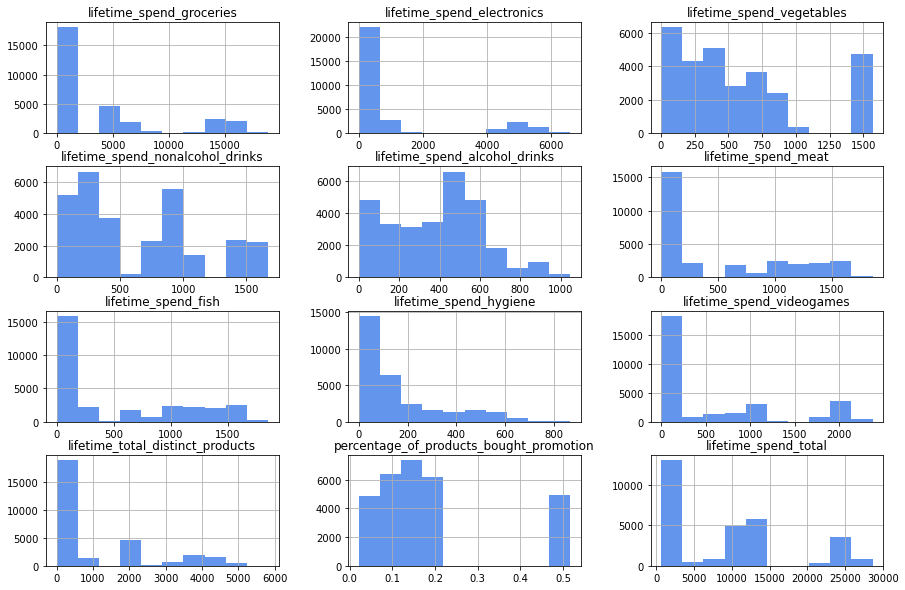

In [36]:
cust_info[['lifetime_spend_groceries','lifetime_spend_electronics','lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat','lifetime_spend_fish', 'lifetime_spend_hygiene','lifetime_spend_videogames', 'lifetime_total_distinct_products',
'percentage_of_products_bought_promotion','lifetime_spend_total']].hist(color='cornflowerblue')
plt.show()

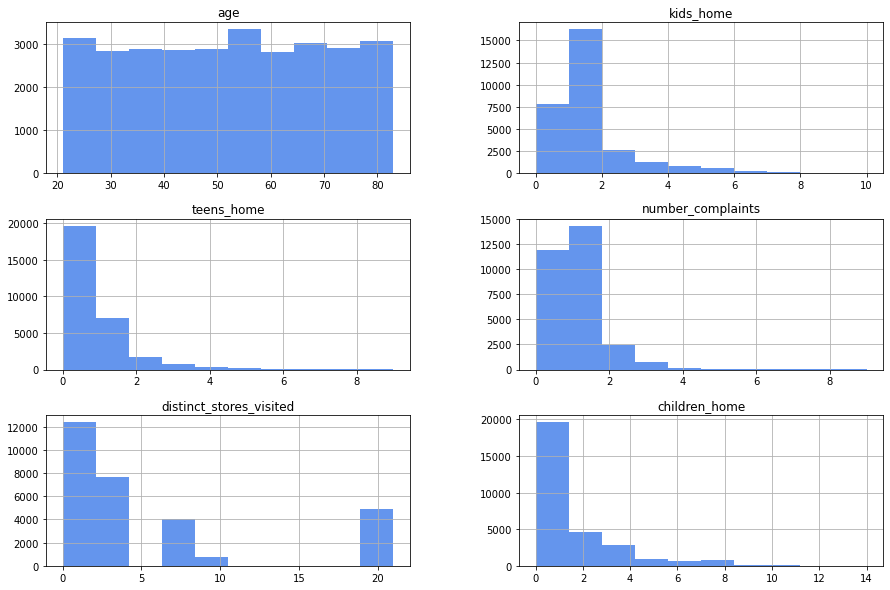

In [37]:
cust_info[['age','kids_home', 'teens_home', 'number_complaints','distinct_stores_visited','children_home']].hist( color='cornflowerblue')
plt.show()

After careful analysis, we found that the histograms did not exhibit significant differences or extreme values that would suggest the presence of outliers. Additionally, considering the upcoming clustering analysis, it is possible that the seemingly "more distant" values could represent distinct clusters rather than outliers. As a result, we have decided not to consider any outliers in our subsequent analysis, as they could potentially contribute to valuable insights and segmentation within the data.

## 4.5. Correlation Matrix <a class="anchor" id="section_4_5"></a>

We use the correlation matrix to summarize the correlations between all variables in a dataset and to see the relationship between the features to check wether they're strongly correlated or not. <br> 
We use the ``Spearman's`` method to be able to see the relationships of the continous and discrete varible.

In [38]:
features_corr=[ 'age', 'kids_home', 'teens_home', 'number_complaints',
       'distinct_stores_visited', 'lifetime_spend_groceries',
       'lifetime_spend_electronics', 'typical_hour',
       'lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
       'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat',
       'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_total_distinct_products',
       'percentage_of_products_bought_promotion', 'year_first_transaction',
'latitude', 'longitude', 'children_home', 'lifetime_spend_total']

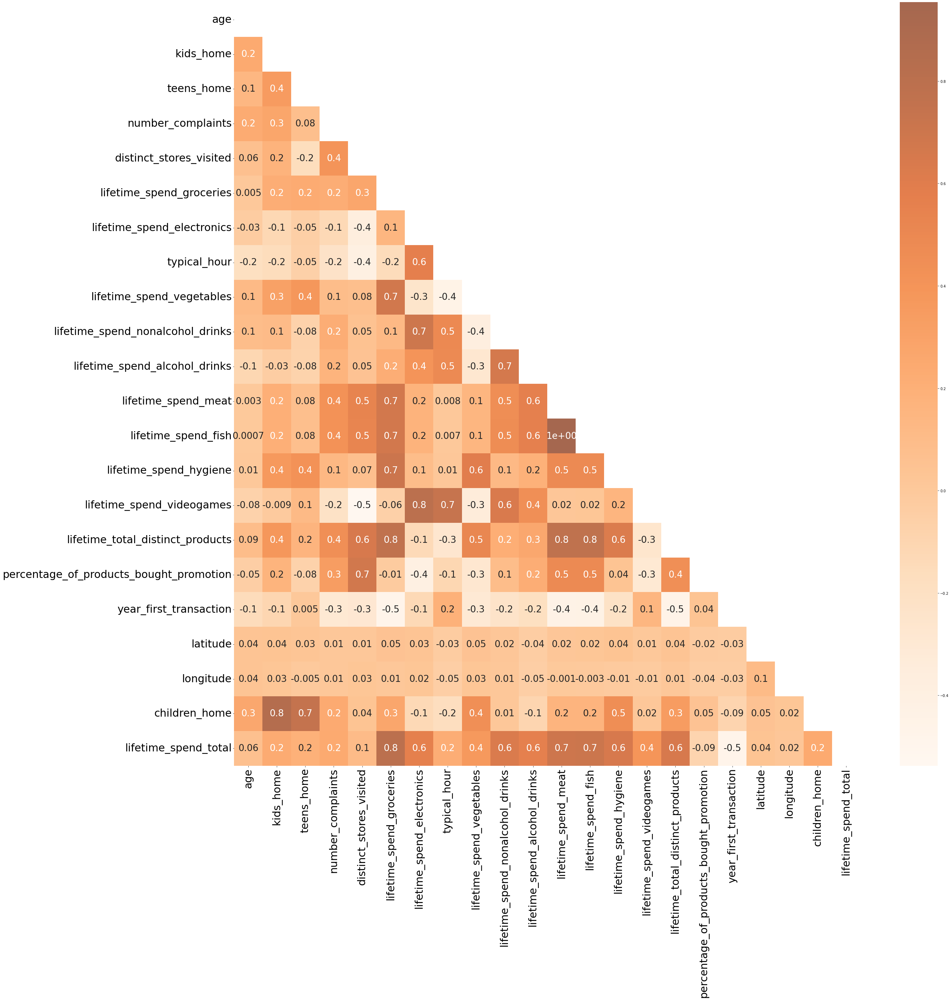

In [39]:
s_corr = cust_info[features_corr].corr(method = 'spearman')
correlation_heatmap(s_corr)  

After assessing the correlation values, we identified several highly correlated features. To reduce redundancy and multicollinearity, we made the decision to eliminate some features that have a correlation higher than 0.8. <br>

Considering the strong correlation between *lifetime_spend_fish* and *lifetime_spend_meat* (correlation coefficient of 1),  we decided to create *lifetime_spend_fish_and_meat* and add the lifetime spend on fish and meat to reflect the close relationship between these categories. <br>

Since the correlation between 'lifetime_spend_videogames' is 0.8 with 'lifetime_spend_electronics' and because they are concepts that have a lot to do with each other, we decided to join them as well into the feature'lifetime_spend_electronics_video'. <br>


In [40]:
cust_info.insert(loc = 26,column = 'lifetime_spend_fish_and_meat',
          value = cust_info[['lifetime_spend_fish', 'lifetime_spend_meat']].sum(axis=1))
cust_info.insert(loc = 26, column = 'lifetime_spend_electronics_video',
          value = cust_info[['lifetime_spend_electronics', 'lifetime_spend_videogames']].sum(axis=1))

cust_info = cust_info.drop([ 'lifetime_spend_meat','lifetime_spend_fish',
                              'lifetime_spend_videogames','lifetime_total_distinct_products','teens_home',
                              'kids_home','lifetime_spend_electronics'], axis = 1)


In [41]:
supermarket_cluster.insert(loc = 26,column = 'lifetime_spend_fish_and_meat',
          value = supermarket_cluster[['lifetime_spend_fish', 'lifetime_spend_meat']].sum(axis=1))
supermarket_cluster.insert(loc = 26, column = 'lifetime_spend_electronics_video',
          value = supermarket_cluster[['lifetime_spend_electronics', 'lifetime_spend_videogames']].sum(axis=1))

supermarket_cluster = supermarket_cluster.drop(['lifetime_spend_meat','lifetime_spend_fish',
                              'lifetime_spend_videogames','lifetime_total_distinct_products','teens_home',
                              'kids_home','lifetime_spend_electronics'], axis = 1)

So after changing some features, we decided to eliminate *lifetime_spend_meat*,*lifetime_spend_fish*, *lifetime_spend_videogames*, *lifetime_total_distinct_products*, *teens_home*, *kids_home*, *lifetime_spend_electronics* from ``cust_info`` and ``supermarket_cluster``
These procedures aid in streamlining the dataset and guarantee that we are not using unnecessary data to our analysis later on.


## 4.6. Final Features <a class="anchor" id="section_4_6"></a>

> ## 4.6.1. Feature's classification <a class="anchor" id="sub_section_4_6_1"></a>

The following code shows that we are simply creating new variables to facilitate the extraction of information for/from each, which are organized as: <br>
- **features_categorical** (only categorical  features stored); <br>
- **features_numerical** (only numerical features stored); <br>
- **features_discrete** (only discrete features); <br>
- **features_continuous** (only continuous features). <br>

In [42]:
features_numerical=['age', 'number_complaints','distinct_stores_visited','children_home','typical_hour','year_first_transaction','lifetime_spend_electronics_video','lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
'lifetime_spend_alcohol_drinks', 'lifetime_spend_fish_and_meat', 'lifetime_spend_hygiene','lifetime_spend_groceries','lifetime_spend_total',
'percentage_of_products_bought_promotion']

features_categorical=['customer_name','Education','loyalty_card','Male']

features_discrete=['age', 'number_complaints','distinct_stores_visited','children_home','typical_hour','year_first_transaction']

features_continuous=['lifetime_spend_electronics_video','lifetime_spend_vegetables', 'lifetime_spend_nonalcohol_drinks',
'lifetime_spend_alcohol_drinks', 'lifetime_spend_fish_and_meat', 'lifetime_spend_hygiene','lifetime_spend_groceries',
'percentage_of_products_bought_promotion','lifetime_spend_total']

> ## 4.6.2. Final DataSet <a class="anchor" id="sub_section_4_6_2"></a>

In this part named "Final features," we compiled the outcomes of numerous data preparation procedures, including feature development, handling of inconsistencies, handling of missing values, and elimination of highly correlated features. <br>
We decided to create a table summarizing the chosen and created features in order to give a clear overview of the characteristics that will be used in the next chapters. 

| Features | Data | Description | 
| --- | --- |  --- | 
| customer_name |  Categorical |  Name of the customer | 
| age | Discrete |  Age of the customer | 
| number_complaints |  Discrete | Number of complaints formally done by the customer |
| distinct_stores_visited |  Discrete | Number of distinct stores visited by the customer | 
| lifetime_spend_electronics_video | Continuous | Total value spent by the customer on electronics including videogames |
| typical_hour | Discrete | Typical hour when the customer visits the store | 
| lifetime_spend_vegetables |  Continuous | Total value spent by the customer on vegetables |
| lifetime_spend_nonalcohol_drinks | Continuous | Total value spent by the customer on non-alcoholic drinks | 
| lifetime_spend_alcohol_drinks |  Continuous | Total value spent by the customer on alcoholic drinks | 
| lifetime_spend_fish_and_meat | Continuous | Total value spent by the customer on fish and meat | 
| lifetime_spend_hygiene | Continuous | Total value spent by the customer on hygiene | 
| percentage_of_products_bought_promotion |  Continuous | Percentage of products that were bought with some promotion | 
| year_first_transaction | Discrete | Year of the first transaction of the customer |
| latitude | Continuous |  Approximate location of the customer's home (Latitude) |
| longitude | Continuous |  Approximate location of the customer's home (Longitude) | 
| loyalty_card |  Binary | 1 if the customer has loyalty card, 0 otherwise | 
| Male |  Binary | Gender of the customer. If 1 its a male customer, if 0 otherwise | 
| Education |  Categorical | Degree level of each customer |
| children_home | Discrete |  Number of kids and teens at home | 
| lifetime_spend_total | Continuous | Total value spent by the customer | 


# 5. Clustering Algorithms <a class="anchor" id="chapter5"></a>

Clustering algorithms are machine learning techniques used for customer segmentation. They group similar data points based on patterns and similarities. <br>
For our project, we need to do client segmentation, a common application of clustering, that will help us understand customer behavior and preferences. By clustering customers into distinct groups, we can tailor marketing strategies and improve customer satisfaction, and to do that we will use the Association Rules for each segment in our solution.

## 5.1. Scaling the data  <a class="anchor" id="section_5_1"></a>

Scaling is essential in clustering, such as K-Means, since it depends on the concept of distance, as it resolves problems associated with varying feature scales and interpretability. Scaling ensures equal feature importance and avoids skewed results. In our case, we decided to use the Standard Scaler.

In [43]:
data_temp_k = cust_info.drop(['customer_name', 'Education'], axis = 1)

In [44]:
feat_scaler = StandardScaler()
data_temp_k[features_numerical] = feat_scaler.fit_transform(data_temp_k[features_numerical])

## 5.2. K-Means  <a class="anchor" id="section_5_2"></a>

After using various clustering methods, explained on our report, we realized that the K-means gave us the best results. <br>
K-means is a popular clustering algorithm used to partition data into k distinct clusters. K-means assigns each data point to the nearest centroid and iteratively updates the centroids until convergence. This algorithm is widely used for customer segmentation, pattern recognition, and data analysis tasks.
<br> <br> 
To decide the best number of clusters we decide to plot the dispersion (inertia) against the number of clusters. This plot helps in identifying the elbow point. The elbow point represents the best number of clusters, as it signifies a significant slowdown in the rate of decrease in dispersion.

In [45]:
dispersion = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(data_temp_k)
    dispersion.append(kmeans.inertia_)

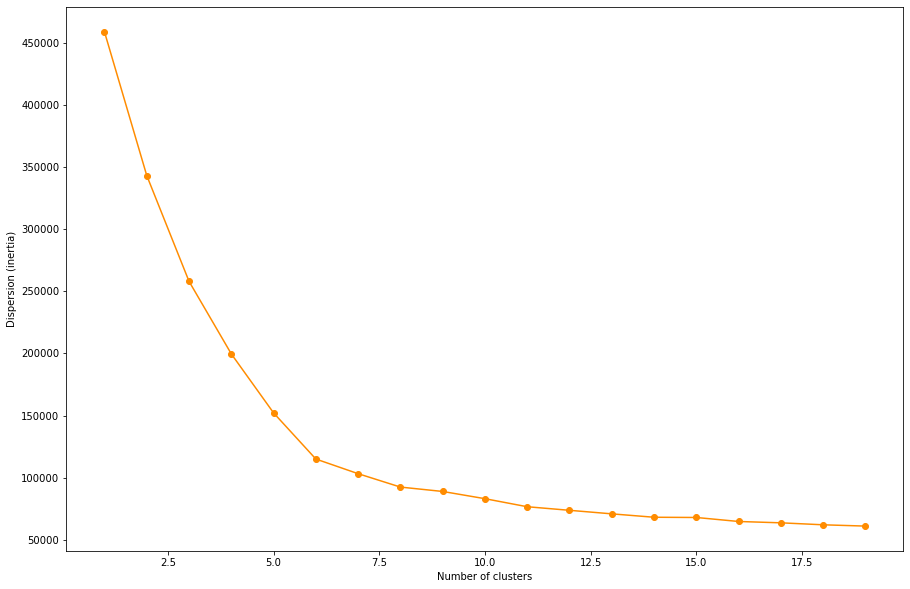

In [46]:
plt.plot(range(1, 20), dispersion, marker='o', color='darkorange')
plt.xlabel('Number of clusters')
plt.ylabel('Dispersion (inertia)')
plt.show()

To benchmark our decision of optimum number of clusters we decided to compute the silhouette scores. <br>
The silhouette scores can help us decide the optimum number of clusters by examining the scores for different cluster numbers. A higher silhouette score indicates better-defined and more distinct clusters, while a lower score suggests overlapping or poorly separated clusters.

In [47]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
silhouette_scores = compute_silhouette_scores(data_temp_k.values, range_n_clusters)
print(silhouette_scores)

For n_clusters = 2 The average silhouette_score is: 0.27174043589349856
For n_clusters = 3 The average silhouette_score is: 0.319451313075198
For n_clusters = 4 The average silhouette_score is: 0.39080125644335184
For n_clusters = 5 The average silhouette_score is: 0.4306316061450293
For n_clusters = 6 The average silhouette_score is: 0.4714952823352651
For n_clusters = 7 The average silhouette_score is: 0.4707198677687455
For n_clusters = 8 The average silhouette_score is: 0.4793640624471343
For n_clusters = 9 The average silhouette_score is: 0.45063168522880687
For n_clusters = 10 The average silhouette_score is: 0.4288637955117489
For n_clusters = 11 The average silhouette_score is: 0.4150507286182722
For n_clusters = 12 The average silhouette_score is: 0.3763264991164983
For n_clusters = 13 The average silhouette_score is: 0.32019384092335607
For n_clusters = 14 The average silhouette_score is: 0.2708460447079091
[0.27174043589349856, 0.319451313075198, 0.39080125644335184, 0.43063

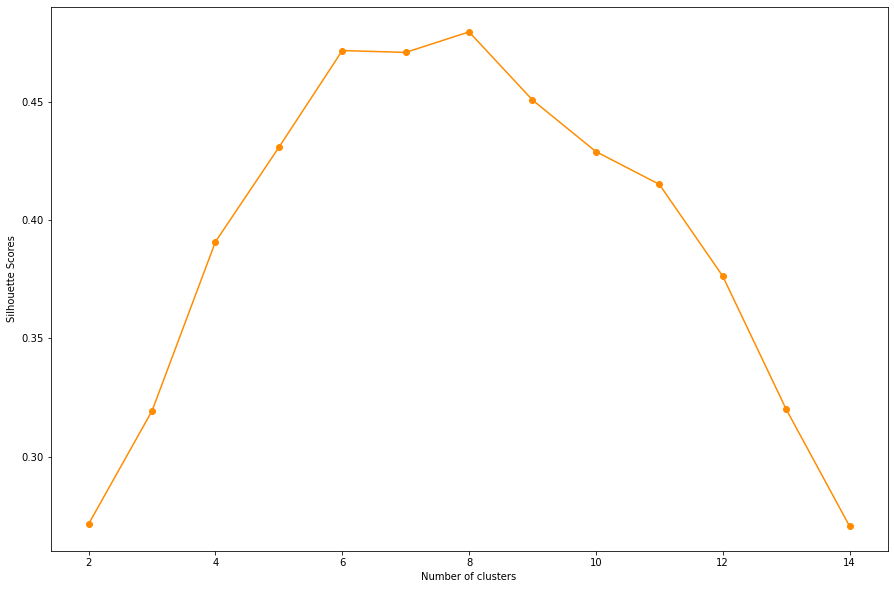

In [48]:
plt.plot(range(2, 15), silhouette_scores, marker='o', color='darkorange')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Scores')
plt.show()

As we can see for the plots above, considering both metrics, elbow and silhouette plot, 8 clusters seems to be the best number. 

In [49]:
kmeans_solution = KMeans(n_clusters=8, random_state=42).fit(data_temp_k)
cluster_labels = kmeans_solution.predict(data_temp_k)
cluster_labels += 1  # Add 1 to shift the labels from 0-7 to 1-8
cust_info['cluster'] = cluster_labels

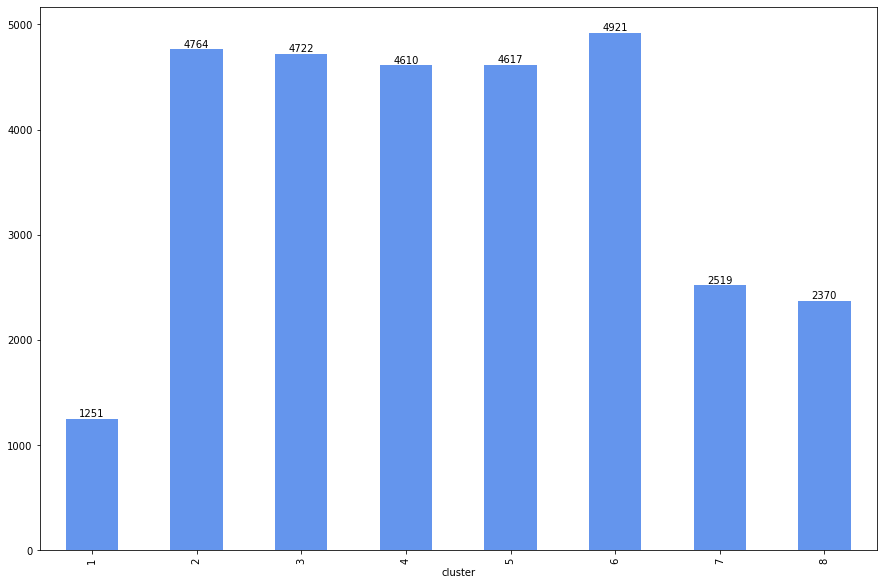

In [50]:
# Group the data by 'cluster' and calculate the size of each group
cluster_counts = cust_info.groupby('cluster').size()

# Create the bar plot
ax = cluster_counts.plot(kind='bar', color='cornflowerblue')

# Add text annotations above each bar
for i, count in enumerate(cluster_counts):
    ax.text(i, count, str(count), ha='center', va='bottom')

# Display the plot
plt.show()


Above we can see the distribution of our clusters. Now it is time to use Multidimensionality Visualization  methods to see how good ours clusters are.  

 # 6. Multidimensionality Visualization <a class="anchor" id="chapter6"></a>

In this section we will make use of techniques like t-SNE and UMAP are crucial resources for managing high-dimensional data in the field of data visualization. We may simplify and visualize complicated datasets using t-SNE (t-Distributed Stochastic Neighbor Embedding), and UMAP (Uniform Manifold Approximation and Projection).


## 6.1. T-SNE <a class="anchor" id="section_6_1"></a>

The visualization technique known as <span style='color:Pink'> T-Distributed Stochastic Neighbor Embedding </span> emphasizes the local structure of data points, making it useful for displaying clusters and locating links in large datasets.

In [51]:
cluster_kmeans = cust_info['cluster']

In [52]:
tsne_model_ = TSNE(n_components=2, perplexity=500, random_state=42)
tsne_cust = tsne_model_.fit_transform(data_temp_k)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

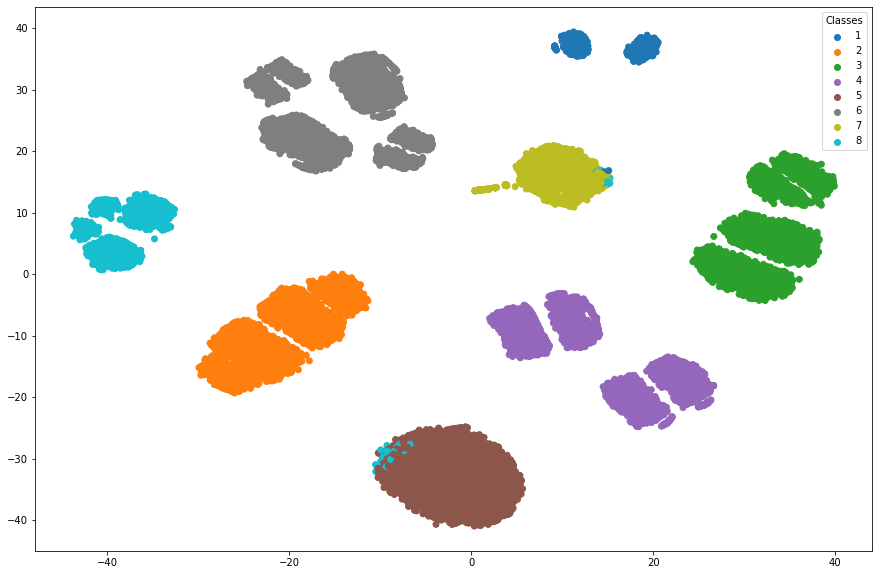

In [53]:
visualize_dimensionality_reduction(tsne_cust, np.array(cluster_kmeans))

## 6.2. UMAP <a class="anchor" id="section_6_2"></a>

A potent dimension reduction method known as <span style='color:Pink'> Uniform Manifold Approximation and Projection </span> maintains both local and global data structures, allowing for the depiction of complex patterns and nonlinear interactions.

In [54]:
umap_object = umap.UMAP(n_neighbors=300, min_dist=0.8, random_state=42)

In [55]:
%%time
umap_embedding = umap_object.fit_transform(data_temp_k)

CPU times: total: 3min 44s
Wall time: 2min 7s


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

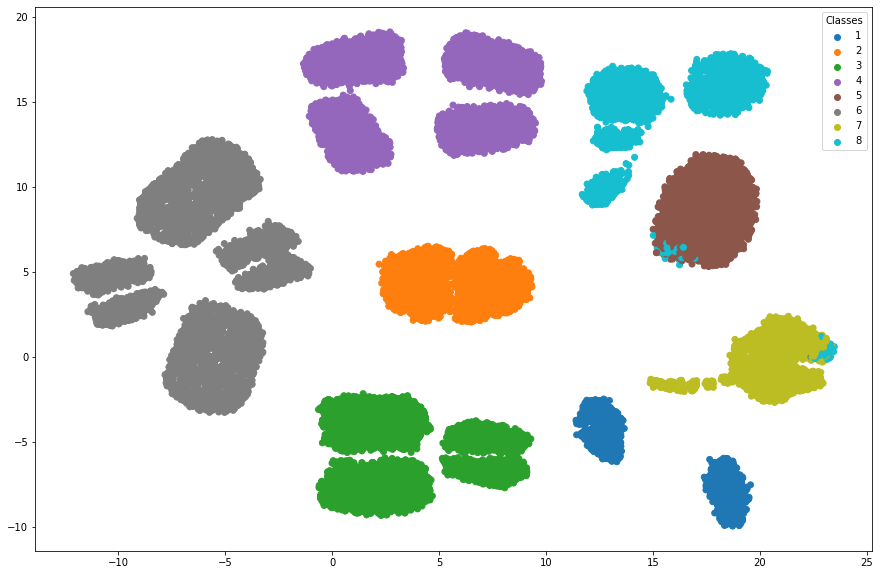

In [56]:
# create a scatter plot of the UMAP output
visualize_dimensionality_reduction(umap_embedding, np.array(cluster_kmeans))

> UMAP and t-SNE, two dimensionality reduction techniques, were applied to our dataset, revealing distinct and robust clusters. Both UMAP and t-SNE visualizations showcased clear separation among the clusters, indicating inherent structure in the data. These findings suggest that our data can be effectively grouped into meaningful categories. Further analysis and exploration of these clusters can provide valuable insights across various domains.

 # 7. Analysing the clusters <a class="anchor" id="chapter7"></a>

In this chapter, we will analyze each cluster in detail by computing mean, mode, and median values. This will help us understand their unique characteristics and compare them with the original statistical data.<br> 
Additionally, we'll use association rules to suggest targeted promotions based on item associations within each cluster.<br>
By combining statistical analysis and association rules, we can gain insights into cluster preferences and propose relevant promotions.

## 7.1. Exploring Cluster Profiles  <a class="anchor" id="section_7_1"></a>

In this section, we will merge the clusters created using K-means with the existing Supermarket Cluster, and the original data set.<br>
We will compare the medians of continuous features and discrete features, and the modes of categorical features between the merged datasets and the original dataset. By combining all the datasets, we can identify specific characteristics associated with each cluster.<br>
This analysis will provide insights into the distinct traits and behaviors of different customer segments.
We use median instead of mean as it is more robust to extreme values.

- Compute mode and median for the clusters created through K-Means calling the <span style='color:Blue'> calculate_cluster_statistics() </span> function  present in utils.py. 

In [57]:
db_clusters = []  # List to store the cluster-wise statistics

for cluster_id in range(1, 9):  
    cluster_data = cust_info.groupby('cluster').get_group(cluster_id)
    cluster_stats = calculate_cluster_statistics(cluster_data, features_categorical, features_numerical, f'Cluster {cluster_id}')
    db_clusters.append(cluster_stats)

db_clusters_df = pd.concat(db_clusters, axis=1)

- Compute mode and median for the supermarket cluster calling the <span style='color:Blue'> calculate_cluster_statistics() </span> function  present in utils.py. 

In [58]:
super_cluster = calculate_cluster_statistics(supermarket_cluster,features_categorical, features_numerical, 'Supermarket Cluster')

- Compute mode and median for the original dataset calling the <span style='color:Blue'> calculate_cluster_statistics() </span> function  present in utils.py. 

In [59]:
original = calculate_cluster_statistics(cust_info,features_categorical, features_numerical, 'Original')

Now it is time to merge all the datasets and compare the clusters with each other and with the original dataset.

In [60]:
merged_means = pd.concat([db_clusters_df, super_cluster, original], axis=1)
merged_means

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,Supermarket Cluster,Original
customer_name,James Hernandez,David Jackson,Christopher Smith,Dana Davis,Anne Jones,Mary Smith,Elizabeth Perez,Dorothy Johnson,James`s Supermarket,Robert Smith
Education,No Higher Education,No Higher Education,No Higher Education,No Higher Education,No Higher Education,No Higher Education,No Higher Education,Bsc.,No Higher Education,No Higher Education
loyalty_card,0,1,0,0,0,0,0,0,0,0
Male,1,1,1,1,1,1,1,0,0,1
age,22.0,56.0,55.0,56.0,56.0,55.0,57.0,29.0,50.0,52.0
number_complaints,0.0,2.0,0.0,0.5,1.0,1.0,1.0,0.0,0.0,1.0
distinct_stores_visited,2.0,8.0,2.0,2.0,3.0,20.0,2.0,3.0,1.0,3.0
children_home,0.0,1.0,2.0,1.0,5.0,1.0,1.0,0.0,0.0,1.0
typical_hour,22.0,12.0,10.0,21.0,18.0,9.0,14.0,19.0,0.0,14.0
year_first_transaction,2017.0,2000.0,2010.0,2010.0,2010.0,2010.0,2010.0,2010.0,2010.0,2009.0


Using the provided dataframe, we can analyze and describe each cluster to assign appropriate names based on their characteristics. Let's begin with the first cluster:

####  <span style='background: sandybrown' > Cluster 1 - Students: </span> 
This cluster represents young male customers with no higher education. 

They have no complaints and visit a few distinct stores. They have no children at home and prefer shopping at night. These customers started their transactions in 2017 and do not have a loyalty card. Their spending is relatively lower compared to other clusters, with minimal expenditures on electronics, groceries, fish and meat, hygiene products, and vegetables. They show a moderate preference for buying products on promotion. An important characteristic is that they spend a lot of their budget on alcohol drinks.

For these reasons, mostly because of the age and the spendings in alcoholic drinks, we named this cluster as **Students**.


####  <span style='background: sandybrown' > Cluster 2 - Loyal Grocery Shoppers: </span> 
Cluster 2 consists of customers who have shown a strong commitment to their shopping habits, as they hold a loyalty card and have been making purchases since 2000 and they are mostly male.

Notably, these customers demonstrate a significant focus on fish, meat, and groceries, indicating a preference for essential food items. <br>

Their substantial spending in these categories suggests a possible emphasis on quality, freshness, or adherence to a particular dietary lifestyle. With their long-standing loyalty and dedicated approach to grocery shopping, Cluster 1 can be described as 
**Loyal Grocery Shoppers**.

####  <span style='background: sandybrown' > Cluster 3 - Vegetarian Family: </span> 
In Cluster 3, represented by Christopher Smith, customers show a complete avoidance or extremely low expenditure on meat and fish. 

They prioritize a vegetarian or plant-based diet, focusing primarily on vegetables. They also exhibit minimal spending on drinks and alcohol. These individuals demonstrate a strong inclination towards a healthy lifestyle, emphasizing plant-based food choices and reducing their consumption of animal products.

A suitable name for this cluster could be "Vegetarian Family". These name reflect the cluster's focus on vegetable consumption, minimal spending on meat and fish, and a commitment to a healthy and sustainable lifestyle, including the fact that has a median of two children.

####  <span style='background: sandybrown' > Cluster 4 - Tech Enthusiasts: </span> 
This cluster represents mostly midle age male customers with no higher education and one children, like Dana Davis. <br>

Cluster 4 comprises customers with distinct spending patterns. They demonstrate a strong affinity for electronics and video-related products, indicating a tech-savvy nature. Additionally, they allocate a significant portion of their spending towards various beverages, including both alcoholic and non-alcoholic drinks. However, their expenditure on meat, vegetables, hygiene products, and groceries is relatively lower compared to other customer clusters.

 ####  <span style='background: sandybrown' > Cluster 5 - Family Shoppers: </span> 
 Cluster 5, named **Family Shoppers** consists of customers who have a higher number of children at home, specifically five children.

These customers prioritize meeting the needs of their household and exhibit a higher lifetime spend on groceries, hygiene products, and other household-related items. They understand the importance of providing for their family's needs and maintaining a well-stocked home.

This cluster represents mature families who engage in responsible and strategic shopping, focusing on essential items for their larger household.

 ####  <span style='background: sandybrown' >  Cluster 6 - Promotion Hunters: </span> 
This cluster represents mostly midle age male customers with no higher education and one children, like Mary Smith.

Cluster 6, is characterized by a strong inclination towards promotional offers, as nearly half of the products purchased by customers in this cluster are on promotion. These customers actively seek out discounts and special deals, indicating a cost-conscious approach to shopping. Additionally, they tend to visit a significant number of distinct stores, suggesting a willingness to explore various shopping destinations in search of the best bargains.
An important characteristics, it that this customers, spend almost anything in videogames and eletronics.

####  <span style='background: sandybrown' >  Cluster 7 - Casual Shoppers: </span> 
These shoppers consists of moderate spenders. They have no higher education and have made about 1 complaint. These customers visit around 2 distinct stores and typically shop at 2 PM. They have been engaged with the supermarket since 2010. Their highest values are for electronics and video games and for fish and meat, but even then they are not very high. The rest of their spendings fall bellow the general average, which may indicate that they are not avid customers, maybe just visiting when it’s convenient, and not actually their preferred stores. This means that they are just casual shoppers, being the ones with the highest risk of being lost to the competitor stores as they do not seem loyal in the first place. 

####  <span style='background: sandybrown' > Cluster 8 - Young Educated Moderate: </span> 
This cluster represents young, female educated customers who have a moderate spending pattern. 

They visit a few distinct stores and do not have any complaints. They have no children at home and prefer shopping in the evening. These customers started their transactions in 2010 and do not hold a loyalty card. 

They predominantly spend on electronics, groceries, and hygiene products, while their spending on vegetables, non-alcoholic drinks, and alcoholic drinks is moderate. These customer has a high lifetime spendings in total, considering that they do not have kids.

So we named this cluster **Young Educated Moderate**.

####  <span style='background: sandybrown' > Supermarket Cluster - Wholesale Meat and Seafood Distributors: </span> 
The Supermarket Cluster represents a segment of customers, predominantly females, without higher education, who primarily function as resellers, specializing in the distribution of fish and meat products. They have no children at home and show limited spending on other product categories. 

These customers exhibit a significantly higher lifetime spend specifically on fish and meat items, indicating their role as resellers.

> Now that we have classified and named our clusters, it is important create association rules for each. This will allow us to us to propose customized rules and promotions based on the distinct characteristics and preferences of each group.<br>
These rules enable us to unveil patterns and correlations within the clusters, facilitating personalized recommendations and targeted promotions. Leveraging these insights allows us to optimize our marketing strategies and enhance customer satisfaction by delivering relevant products or services that align with their individual needs and purchasing behaviors.

## 7.2. Association Rules  <a class="anchor" id="section_7_2"></a>

Association rules are a powerful technique that identify patterns in large datasets. They uncover relationships between items or variables, enabling targeted marketing and informed decision-making.

To do that we first need to separate each cluster into a dataframe. For that we use the  <span style='color:Blue'> create_cluster_dataframes() </span> function  present in utils.py. 

In [61]:
cluster_dataframes = create_cluster_dataframes(cust_info, basket, 9)

In [62]:
df1 = cluster_dataframes['df1']
df2 = cluster_dataframes['df2']
df3 = cluster_dataframes['df3']
df4 = cluster_dataframes['df4']
df5 = cluster_dataframes['df5']
df6 = cluster_dataframes['df6']
df7 = cluster_dataframes['df7']
df8 = cluster_dataframes['df8']
df_super = supermarket_cluster.merge(basket, on="customer_id")

For every cluster we Using <span style='color:Blue'>generate_association_rules() </span> function present in utils.py, to generate association rules for each
cluster. 

These association rules provide insights into the relationships between different products and the likelihood of customers purchasing them together. Before analysing the output of the association rules of each cluster it is important to understand some concepts:
- The support represents the frequency of occurrence of the rule;
- The confidence indicates the conditional probability of the consequent item given the antecedent item. 
- The lift is a measure of the strength of association between two items in association rules analysis. It quantifies how much more likely the items are to occur together than if they were independent of each other. A lift value greater than 1 indicates a positive association, suggesting that the presence of one item increases the likelihood of the other item being present. In the given analysis, all clusters showed lift values greater than 1, indicating a significant association between items within each cluster. For this motive, we decided to always look for those rules where the lift is higher than 1.

These findings can be useful for targeted marketing, product placement strategies, and optimizing product recommendations to improve customer satisfaction and sales.

 > ### 7.2.1. Students <a class="anchor" id="sub_section_7_2_1"></a>

In [63]:
rules_cluster1 = generate_association_rules(df1)

In [64]:
filtered_data1 = rules_cluster1[(rules_cluster1['lift'] > 1.21)]
filtered_data1

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
139,(whole weat flour),(dessert wine),0.077813,0.415002,0.039958,0.513514,1.237377,0.007665,1.202496
392,(cologne),"(cider, white wine)",0.042411,0.439187,0.023134,0.545455,1.241965,0.004507,1.233789
410,"(mayonnaise, dessert wine)",(cider),0.030144,0.554154,0.020329,0.674419,1.217025,0.003625,1.369386
419,"(cider, whole weat flour)",(dessert wine),0.044164,0.415002,0.023835,0.539683,1.300434,0.005506,1.270858
450,(ketchup),"(cider, white wine)",0.091483,0.439187,0.049071,0.536398,1.221345,0.008893,1.209688
500,(toilet paper),"(cider, white wine)",0.042762,0.439187,0.022783,0.532787,1.213121,0.004003,1.200337
548,"(whole weat flour, white wine)",(dessert wine),0.063442,0.415002,0.031896,0.502762,1.211471,0.005568,1.176496
607,"(gums, dessert wine)","(cider, white wine)",0.048370,0.439187,0.026639,0.550725,1.253964,0.005395,1.248262
609,"(white wine, dessert wine, ketchup)",(cider),0.030144,0.554154,0.020329,0.674419,1.217025,0.003625,1.369386
610,"(dessert wine, ketchup)","(cider, white wine)",0.036453,0.439187,0.020329,0.557692,1.269829,0.004320,1.267925


About this cluster:

- Line 4: Customers who buy cider and whole wheat flour are likely to also buy dessert wine. The support for this rule is 2.38%, indicating that 2.38% of customers in this cluster buy cider, whole wheat flour, and dessert wine together. The confidence is 53.97%, meaning that among customers who buy cider and whole wheat flour, 53.97% also purchase dessert wine. The lift is 1.30, indicating a moderately stronger association between these items than what would be expected by chance.

- Line 8: Customers who buy dessert wine and gums are likely to also buy cider and white wine. The support for this rule is 2.66%, meaning that 2.66% of customers in this cluster buy dessert wine, gums, cider, and white wine together. The confidence is 55.07%, indicating that among customers who buy dessert wine and gums, 55.07% also purchase cider and white wine. The lift is 1.25, suggesting a moderately stronger association between these items than what would be expected by chance.

- Line 10: Customers who buy dessert wine and ketchup are likely to also buy cider and white wine. The support for this rule is 2.03%, indicating that 2.03% of customers in this cluster buy dessert wine, ketchup, cider, and white wine together. The confidence is 55.77%, meaning that among customers who buy dessert wine and ketchup, 55.77% also purchase cider and white wine. The lift is 1.27, suggesting a moderately stronger association between these items than what would be expected by chance.

This makes sense since the students shoppers have higher lifetime spend on alcoholic drinks. Note that for this cluster we had to decrease the value of support.

> ### 7.2.2. Loyal Grocery Shoppers <a class="anchor" id="sub_section_7_2_2"></a>


In [65]:
rules_cluster2 = generate_association_rules(df2)

In [66]:
filtered_data2 = rules_cluster2[(rules_cluster2['lift'] > 1.075) ]
filtered_data2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
306,"(cake, eggs)",(cooking oil),0.031305,0.656398,0.022303,0.712460,1.085408,0.001755,1.194970
541,(cotton buds),"(cooking oil, oil)",0.034355,0.576086,0.021303,0.620087,1.076379,0.001512,1.115819
882,"(cooking oil, eggs, oil)",(cake),0.037156,0.508376,0.020353,0.547779,1.077508,0.001464,1.087132
883,"(eggs, cake, oil)",(cooking oil),0.028304,0.656398,0.020353,0.719081,1.095495,0.001774,1.223135
884,"(cake, eggs)","(cooking oil, oil)",0.031305,0.576086,0.020353,0.650160,1.128580,0.002319,1.211735


About this cluster:

- Customers who buy eggs and cake are likely to also buy cooking oil. The support for this rule is 2.23%, indicating that 2.23% of customers in this cluster buy eggs, cake, and cooking oil together. The confidence is 71.25%, meaning that among customers who buy eggs and cake, 71.25% also purchase cooking oil. The lift is 1.09, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy cotton buds are likely to also buy cooking oil and oil. The support for this rule is 2.13%, meaning that 2.13% of customers in this cluster buy cotton buds, cooking oil, and oil together. The confidence is 62.01%, indicating that among customers who buy cotton buds, 62.01% also purchase cooking oil and oil. The lift is 1.08, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy eggs, cooking oil, and oil are likely to also buy cake. The support for this rule is 2.04%, indicating that 2.04% of customers in this cluster buy eggs, cooking oil, oil, and cake together. The confidence is 54.78%, meaning that among customers who buy eggs, cooking oil, and oil, 54.78% also purchase cake. The lift is 1.08, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy eggs, cake, and oil are likely to also buy cooking oil. The support for this rule is 2.04%, indicating that 2.04% of customers in this cluster buy eggs, cake, and oil together. The confidence is 71.91%, meaning that among customers who buy eggs, cake, and oil, 71.91% also purchase cooking oil. The lift is 1.10, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy eggs and cake are likely to also buy cooking oil and oil. The support for this rule is 2.04%, indicating that 2.04% of customers in this cluster buy eggs, cake, cooking oil, and oil together. The confidence is 65.02%, meaning that among customers who buy eggs and cake, 65.02% also purchase cooking oil and oil. The lift is 1.13, suggesting a slightly stronger association between these items than what would be expected by chance.

This makes sense since the Loyal Grocery Shoppers have higher lifetime spendings on groceries (cake and cooking oil), fish, and meat (eggs). Note that for this cluster we had to decrease the value of support.

 > ### 7.2.3. Vegetarian Family <a class="anchor" id="sub_section_7_2_3"></a>

In [67]:
rules_cluster3 = generate_association_rules(df3)

In [68]:
filtered_data3 = rules_cluster3[(rules_cluster3['lift'] >1.1)]
filtered_data3

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1310,"(cologne, frozen vegetables)","(asparagus, tomatoes)",0.030062,0.656109,0.022010,0.732143,1.115886,0.002286,1.283859
1374,"(toothpaste, green beans)","(asparagus, tomatoes)",0.031029,0.656109,0.022761,0.733564,1.118052,0.002403,1.290707
1436,"(toothpaste, zucchini, tomatoes)",(asparagus),0.025123,0.750805,0.020829,0.829060,1.104228,0.001966,1.457789
1437,"(toothpaste, zucchini)","(asparagus, tomatoes)",0.028130,0.656109,0.020829,0.740458,1.128559,0.002373,1.324991


About this cluster:

- Customers who buy frozen vegetables and cologne are likely to also buy asparagus and tomatoes. The support for this rule is 2.20%, indicating that 2.20% of customers in this cluster buy frozen vegetables, cologne, asparagus, and tomatoes together. The confidence is 73.21%, meaning that among customers who buy frozen vegetables and cologne, 73.21% also purchase asparagus and tomatoes. The lift is 1.12, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy toothpaste and green beans are likely to also buy asparagus and tomatoes. The support for this rule is 2.28%, meaning that 2.28% of customers in this cluster buy toothpaste, green beans, asparagus, and tomatoes together. The confidence is 73.36%, indicating that among customers who buy toothpaste and green beans, 73.36% also purchase asparagus and tomatoes. The lift is 1.12, suggesting a slightly stronger association between these items than what would be expected by chance.

- Customers who buy zucchini, tomatoes, and toothpaste are likely to also buy asparagus. The support for this rule is 2.08%, indicating that 2.08% of customers in this cluster buy zucchini, tomatoes, toothpaste, and asparagus together. The confidence is 82.91%, meaning that among customers who buy zucchini, tomatoes, and toothpaste, 82.91% also purchase asparagus. The lift is 1.10, suggesting a slightly stronger association between these items than what would be expected by chance.

The patterns of vegetable purchases align with the vegetarian nature of the cluster, while the inclusion of hygiene-related items, such as toothpaste and cologne, is likely influenced by the cluster's characteristics, such as the median number of children. 

 > ### 7.2.4. Tech Enthusiasts<a class="anchor" id="sub_section_7_2_4"></a>

In [69]:
rules_cluster4 = generate_association_rules(df4)

In [70]:
filtered_data4 = rules_cluster4[(rules_cluster4['lift'] > 1.11)]
filtered_data4

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
778,"(ratchet & clank 3, ratchet & clank 2)",(pokemon violet),0.046848,0.496060,0.026086,0.556818,1.122480,0.002846,1.137094
826,"(ratchet & clank 2, pokemon sword, airpods)",(pokemon violet),0.043441,0.496060,0.023957,0.551471,1.111700,0.002407,1.123537
873,"(ratchet & clank, pokemon sword, bluetooth hea...",(pokemon violet),0.038756,0.496060,0.021614,0.557692,1.124243,0.002389,1.139342
989,"(pokemon sword, iMac, pokemon violet)",(pokemon shield),0.044932,0.653003,0.032581,0.725118,1.110437,0.003240,1.262353
1239,"(ratchet & clank 3, ratchet & clank 2, pokemon...",(pokemon violet),0.041844,0.496060,0.023637,0.564885,1.138743,0.002880,1.158177
1240,"(ratchet & clank 3, ratchet & clank 2)","(pokemon sword, pokemon violet)",0.046848,0.438458,0.023637,0.504545,1.150726,0.003096,1.133387
1286,"(ratchet & clank, pokemon violet, pokemon scar...","(pokemon shield, pokemon sword)",0.064310,0.574532,0.041525,0.645695,1.123864,0.004577,1.200855
1301,"(white wine, ratchet & clank, pokemon scarlet)","(pokemon shield, pokemon sword)",0.043122,0.574532,0.028003,0.649383,1.130282,0.003228,1.213484


Some association rules from the given cluster:

- Customers who buy "Ratchet & Clank 3" and "Ratchet & Clank 2" are likely to also buy "Pokemon Violet". The support for this rule is 2.61%, and the confidence is 55.68%. The lift value of 1.12 indicates a slightly higher likelihood of buying "Pokemon Violet" compared to its individual support.

- Customers who buy "Ratchet & Clank 2", "Pokemon Sword", and "Airpods" are likely to also buy "Pokemon Violet". The support for this rule is 2.40%, and the confidence is 55.15%. The lift value of 1.11 suggests a slightly increased likelihood of purchasing "Pokemon Violet" in this combination.

- Customers who buy "Ratchet & Clank", "Pokemon Sword", "Bluetooth Headphones", and "Pokemon Violet" are likely to also buy "Pokemon Violet". The support for this rule is 2.16%, and the confidence is 55.77%. The lift value of 1.12 indicates a slightly higher likelihood of buying "Pokemon Violet" in this context.

These association rules reveal the spending patterns of this cluster, highlighting their preference for electronics, video games, and related accessories. The inclusion of alcoholic drinks in some of the rules also supports the observation that this cluster tends to allocate a significant portion of their budget to drinks, further underscoring their tech enthusiast profile.

 > ### 7.2.5. Family Shoppers<a class="anchor" id="sub_section_7_2_5"></a>

In [71]:
rules_cluster5 = generate_association_rules(df5)

In [72]:
filtered_data5 = rules_cluster5[(rules_cluster5['lift']>1.08)]
filtered_data5

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
150,(toilet paper),(cake),0.052816,0.514131,0.029519,0.558897,1.087072,0.002364,1.101488
190,(mint),(cooking oil),0.029916,0.652393,0.021444,0.716814,1.098747,0.001927,1.227489
649,"(cookies, candy bars)",(cake),0.040241,0.514131,0.022569,0.560855,1.090881,0.001880,1.106399
725,"(cream, gums)",(cake),0.036336,0.514131,0.020319,0.559199,1.087658,0.001638,1.102241
790,"(oil, french fries)",(cooking oil),0.030909,0.652393,0.022437,0.725910,1.112689,0.002272,1.268224
1044,"(ketchup, candy bars)","(babies food, cooking oil)",0.075386,0.573036,0.047323,0.627744,1.095470,0.004124,1.146962
1120,"(french fries, ketchup)","(babies food, cooking oil)",0.036270,0.573036,0.022834,0.629562,1.098643,0.002050,1.152593


Some association rules for Family Shoppers cluster:

- Customers who buy "Toilet Paper" are likely to also buy "Cake". The support for this rule is 2.95%, and the confidence is 55.89%. The lift value of 1.09 indicates a slightly higher likelihood of purchasing "Cake" compared to its individual support. This association suggests a potential correlation between these items, possibly indicating that customers buying toilet paper may also have a preference for cake.

- Customers who buy "Mint" are likely to also buy "Cooking Oil". The support for this rule is 2.14%, and the confidence is 71.68%. The lift value of 1.10 suggests a slightly increased likelihood of purchasing cooking oil when mint is also bought. This association may indicate a common purchasing behavior among customers who buy mint and cooking oil, such as using mint as a flavoring in their cooking.

- Customers who buy "Candy Bars" and "Cookies" are likely to also buy "Cake". The support for this rule is 2.26%, and the confidence is 56.09%. The lift value of 1.09 suggests a slightly higher likelihood of purchasing cake when candy bars and cookies are bought together. This association implies that customers who indulge in candy bars and cookies may also have a preference for cake as a sweet treat.

These association rules support the fact that customers in this cluster have about five children, which justifies, for example, the purchase of hygiene products, baby food and other groceries.

 > ### 7.2.6. Promotion Hunters <a class="anchor" id="sub_section_7_2_6"></a>

In [73]:
rules_cluster6 = generate_association_rules(df6)

In [74]:
filtered_data6 = rules_cluster6[(rules_cluster6['lift'] >1.11)]
filtered_data6

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
10,(bacon),(cake),0.042191,0.503245,0.024239,0.574519,1.141628,0.003007,1.167514
257,"(oil, bacon)",(cake),0.035598,0.503245,0.020487,0.575499,1.143574,0.002572,1.170207
284,"(whole wheat rice, candy bars)",(cake),0.038540,0.503245,0.021602,0.560526,1.113823,0.002208,1.130340
349,"(cooking oil, whole wheat rice)",(cake),0.059838,0.503245,0.033570,0.561017,1.114798,0.003457,1.131603
963,"(cooking oil, strong cheese)","(cake, oil)",0.048073,0.445943,0.024037,0.500000,1.121219,0.002599,1.108114
1217,"(napkins, pet food)","(cooking oil, oil)",0.037728,0.582454,0.024544,0.650538,1.116890,0.002569,1.194823


Some association rules for Promotion Hunters : 

- Customers who purchase "Bacon" are likely to also buy "Cake". With an antecedent support of 4.22% and a confidence of 57.45%, this association suggests a potential correlation between these items. The lift value of 1.14 indicates a slightly higher likelihood of purchasing "Cake" compared to its individual support.

- Customers who purchase "Bacon" and "Oil" together are likely to also buy "Cake". With an antecedent support of 3.56% and a confidence of 57.55%, this association implies that the combination of "Bacon" and "Oil" further increases the likelihood of purchasing "Cake". The lift value of 1.14 suggests a slightly increased likelihood compared to the individual support.

- Customers who purchase "Whole Wheat Rice" and "Candy Bars" are likely to also buy "Cake". With an antecedent support of 3.85% and a confidence of 56.05%, this association indicates a potential preference for "Cake" among customers who buy "Whole Wheat Rice" and "Candy Bars". The lift value of 1.11 suggests a slightly higher likelihood of purchasing "Cake" compared to its support.


 > ### 7.2.7.  Casual Shoppers <a class="anchor" id="sub_section_7_2_7"></a>

In [75]:
rules_cluster7 = generate_association_rules(df7)

In [76]:
filtered_data7 = rules_cluster7[(rules_cluster7['lift'] >1.25)]
filtered_data7

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
212,"(beats headphones, bramble)",(dessert wine),0.038368,0.474311,0.022933,0.597701,1.260146,0.004734,1.306713
848,"(phone car charger, beer)","(white wine, dessert wine)",0.042778,0.418523,0.022712,0.530928,1.268576,0.004809,1.239633
949,"(white wine, google tablet, bramble)",(dessert wine),0.044101,0.474311,0.027343,0.620000,1.307159,0.006425,1.383392
951,"(google tablet, bramble)","(white wine, dessert wine)",0.051819,0.418523,0.027343,0.527660,1.260767,0.005655,1.231056
974,"(champagne, half-life: alyx)","(cider, white wine)",0.033076,0.544873,0.022712,0.686667,1.260232,0.004690,1.452532
1120,"(beer, french wine, champagne)","(white wine, dessert wine)",0.037266,0.418523,0.020066,0.538462,1.286577,0.004470,1.259868


The first three association rules from the given Casual Shoppers cluster:

- Customers who purchase "Beats Headphones" and "Bramble" are likely to also buy "Dessert Wine". With an antecedent support of 3.84% and a confidence of 59.77%, this association suggests a potential preference for "Dessert Wine" among customers who buy "Beats Headphones" and "Bramble". The lift value of 1.26 indicates a slightly higher likelihood of purchasing "Dessert Wine" compared to its individual support.

- Customers who purchase "Beer" and "Phone Car Charger" together are likely to also buy "Dessert Wine" and "White Wine". With an antecedent support of 4.28% and a confidence of 53.09%, this association indicates a potential correlation between these items. The lift value of 1.27 suggests a slightly increased likelihood of purchasing "Dessert Wine" and "White Wine" when "Beer" and "Phone Car Charger" are bought together.

- Customers who purchase "Google Tablet", "White Wine", and "Bramble" together are likely to also buy "Dessert Wine". With an antecedent support of 4.41% and a confidence of 62.00%, this association suggests a strong preference for "Dessert Wine" among customers who purchase this specific combination of items. The lift value of 1.31 indicates a higher likelihood of purchasing "Dessert Wine" compared to its individual support. 

Note that at this point this cluster has the higher lift, indicating consistency and conscienciousness on its purchases, really related to eletronics and videogames.


 > ### 7.2.8. Young Educated Moderate <a class="anchor" id="sub_section_7_2_8"></a>

In [77]:
rules_cluster8 = generate_association_rules(df8)

In [78]:
filtered_data8 = rules_cluster8[(rules_cluster8['lift'] >1.12)]
filtered_data8

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
841,"(cooking oil, oil, french fries)",(cake),0.112324,0.500117,0.063263,0.563218,1.126172,0.007088,1.144468
853,"(cake, oil, fromage blanc)",(cooking oil),0.027934,0.645188,0.020305,0.726891,1.126634,0.002282,1.299159
854,"(cake, fromage blanc)","(cooking oil, oil)",0.031690,0.558803,0.020305,0.640741,1.146631,0.002597,1.228075
873,"(cooking oil, mayonnaise, oil)",(cake),0.040610,0.500117,0.022770,0.560694,1.121124,0.002460,1.137891
946,"(napkins, oil, french fries)",(cake),0.044601,0.500117,0.025235,0.565789,1.131313,0.002929,1.151245
1068,"(oil, french fries, ketchup)",(cooking oil),0.030282,0.645188,0.021948,0.724806,1.123403,0.002411,1.289318
1069,"(french fries, ketchup)","(cooking oil, oil)",0.034624,0.558803,0.021948,0.633898,1.134386,0.002600,1.205122
1200,"(cooking oil, oil, gums, french fries)",(cake),0.037793,0.500117,0.021596,0.571429,1.142589,0.002695,1.166393


Examples of association rules of Young Educated Moderates cluster:

- Customers who buy French fries, cooking oil, and oil are moderately likely to also purchase cake. The support for this rule is 6.33%, indicating its occurrence in a significant number of transactions. The confidence of 56.32% suggests a moderate association between the antecedents and the consequent. The lift value of 1.13 indicates a slightly higher likelihood of purchasing cake compared to its individual support.

- Customers who buy mayonnaise, cooking oil, and oil have a moderate likelihood of also purchasing cake. The support for this rule is 2.28%, indicating its occurrence in a reasonable number of transactions. The confidence of 56.07% suggests a moderate association between the antecedents and the consequent. The lift value of 1.12 indicates a slightly higher likelihood of purchasing cake compared to its individual support.

- When customers buy napkins, French fries, and oil, there is a moderate likelihood of them also purchasing cake. The support for this rule is 2.52%, indicating its occurrence in a reasonable number of transactions. The confidence of 56.58% suggests a moderate association between the antecedents and the consequent. The lift value of 1.13 indicates a slightly higher likelihood of purchasing cake compared to its individual support. 

Since clients in this cluster spend a lot of their spending on groceries, where oil, french fries, fromage blanc, for example, are categorized in.

 > ### 7.2.9. Wholesale Meat and Seafood Distributors <a class="anchor" id="sub_section_7_2_9"></a>

In [79]:
rules_super = generate_association_rules(df_super)

In [80]:
filtered_super = rules_super[(rules_super['lift'] > 7)]
filtered_super

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1283,"(asparagus, muffins)","(cooking oil, spaghetti)",0.041420,0.071006,0.023669,0.571429,8.047619,0.020728,2.167653
1904,"(cooking oil, yogurt cake, milk)",(cookies),0.035503,0.076923,0.023669,0.666667,8.666667,0.020938,2.769231
1908,"(yogurt cake, cookies)","(cooking oil, milk)",0.029586,0.094675,0.023669,0.800000,8.450000,0.020868,4.526627
2177,"(asparagus, cake, oil)","(cooking oil, spaghetti)",0.047337,0.071006,0.023669,0.500000,7.041667,0.020307,1.857988
2185,"(cooking oil, spaghetti, muffins)","(asparagus, oil)",0.029586,0.112426,0.023669,0.800000,7.115789,0.020342,4.437870
2189,"(asparagus, oil, muffins)","(cooking oil, spaghetti)",0.035503,0.071006,0.023669,0.666667,9.388889,0.021148,2.786982
2193,"(asparagus, muffins)","(cooking oil, oil, spaghetti)",0.041420,0.071006,0.023669,0.571429,8.047619,0.020728,2.167653


- Customers who buy asparagus and muffins are likely to also purchase cooking oil and spaghetti. The support for this rule is 2.37%, indicating its occurrence in a significant number of transactions. The confidence of 57.14% suggests a moderate association between the antecedents and the consequent. The lift value of 8.05 indicates a significantly higher likelihood of purchasing cooking oil and spaghetti together compared to their individual support.

- This association implies that customers who enjoy yogurt cake and use milk and cooking oil may have a strong preference for cookies as well. The support for this rule is 2.37%, indicating its occurrence in a significant number of transactions. The confidence of 66.67% suggests a strong association between the antecedents and the consequent. The lift value of 8.67 indicates a significantly higher likelihood of purchasing cookies compared to their individual support.

- This association suggests that customers who enjoy yogurt cake and cookies may have a preference for milk and cooking oil as well. The support for this rule is 2.37%, indicating its occurrence in a significant number of transactions. The confidence of 80.00% suggests a strong association between the antecedents and the consequent. The lift value of 8.45 indicates a significantly higher likelihood of purchasing milk and cooking oil together compared to their individual support.

This cluster has very interesting results, since the lift is very very high when comparing to the other clusters and since more than 90% of their lifetime total spend is on meat and fish but any association rules does not have any product in these categories.

## 7.3. Geographical Distribution of Clusters <a class="anchor" id="section_7_3"></a>

In this topic, we will visualize our final dataset, `df_final`, by plotting the clusters using latitude and longitude information. The focus will be on highlighting the geographic distribution and spatial aspect of the clusters.

The following code snippet is used to create a final dataset called df_final, where each customer is assigned to their respective cluster.

In [81]:
cust_info['cluster'] = cust_info['cluster'].replace({1: 'Students',
                                                       2: 'Loyal Grocery Shoppers',
                                                       3: 'Vegetarian Family',
                                                       4: 'Tech Enthusiasts',
                                                       5: 'Family Shoppers',
                                                       6: 'Promotion Hunters',
                                                       7: 'Casual Shoppers',
                                                       8: 'Young Educated Moderate'})
supermarket_cluster['cluster'] = 'Wholesale Meat and Seafood Distributors'
# Join cust_info with supermarket_cluster on cluster
df_final = pd.concat([cust_info, supermarket_cluster], ignore_index=False)

By applying the <span style='color:Blue'> value_counts() </span> method, we can examine the distribution of customers across our final clusters.

In [82]:
df_final['cluster'].value_counts()

Promotion Hunters                          4921
Loyal Grocery Shoppers                     4764
Vegetarian Family                          4722
Family Shoppers                            4617
Tech Enthusiasts                           4610
Casual Shoppers                            2519
Young Educated Moderate                    2370
Students                                   1251
Wholesale Meat and Seafood Distributors     226
Name: cluster, dtype: int64

In [83]:
fig = px.scatter_mapbox(df_final, lat='latitude', lon='longitude', zoom=10, hover_name = 'customer_name', color= 'cluster')

fig.update_layout(mapbox_style="open-street-map")

fig.show()

In addition to the geographical location of the Wholesale Meat and Seafood Distributors cluster, mentioned in topic **4.3. Dataset based on Geographical Distribution** there are other interesting insights to consider:

**1.** The Students Shoppers cluster is situated in areas such as Margem Sul, Campolide, and Campo Grande, which are known for hosting various faculties. This suggests a focus on catering to university students.

**2.** The Young Educated Moderate customers predominantly reside in affluent areas like Parque das Nações, Telheiras, and Benfica. This indicates that these customers are financially comfortable, as reflected in their higher lifetime spending.

**3.** The Family Shoppers cluster comprises customers located in Lisbon, but they tend to reside farther away from the city center.

**4.** Clusters such as Tech Enthusiasts, Promotion Hunters, Vegetarian Family, and Loyal Grocery Shoppers are concentrated in a specific area between Odivelas and Alcantara. The Casual Shoppers cluster also shares this general region, although some of them are located in the direction of Sintra, which is considered a more affordable area.

Overall, the geographical distribution of these clusters provides valuable insights into the preferences and characteristics of different customer segments.

 # 8. Conclusion <a class="anchor" id="chapter8"></a>

In [84]:
df_final.head()

,customer_name,age,number_complaints,distinct_stores_visited,lifetime_spend_groceries,typical_hour,lifetime_spend_vegetables,lifetime_spend_nonalcohol_drinks,lifetime_spend_alcohol_drinks,lifetime_spend_hygiene,...,latitude,longitude,loyalty_card,Male,Education,children_home,lifetime_spend_total,lifetime_spend_electronics_video,lifetime_spend_fish_and_meat,cluster
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,23,0.0,2.0,91.0,22.0,22.0,195.0,964.0,47.0,...,38.754263,-9.163397,0,0,No Higher Education,0,1630.0,125.0,101.0,Students
19330,Donald Robertson,41,0.0,2.0,197.0,21.0,20.0,1435.0,434.0,45.0,...,38.777761,-9.156197,0,1,No Higher Education,1,10304.0,7922.0,166.0,Tech Enthusiasts
2272,Felicia Bradshaw,36,0.0,20.0,397.0,9.0,310.0,379.0,222.0,46.0,...,38.785329,-9.127113,0,0,Phd.,2,2161.0,25.0,374.0,Promotion Hunters
25288,Emma Williams,80,1.0,2.0,5282.0,12.0,499.0,873.0,460.0,617.0,...,38.744086,-9.156589,0,0,No Higher Education,7,13151.0,1315.0,2149.0,Family Shoppers
12829,Hilda Huerta,23,0.0,2.0,82.0,21.0,9.0,172.0,856.0,48.0,...,38.756024,-9.16297,0,0,No Higher Education,0,1453.0,125.0,78.0,Students


In [86]:
# Turning our final dataset into an excel file
df_final.to_excel('Final_Customer_Info.xlsx')

To conclude, we successfully managed to segment 30000 customers in comprehensive groups, providing valuable descriptions on each of them. Our approach involved a thorough exploratory data analysis, with inconsistencies checking, feature transformation and looking for outliers, where we found our first cluster as well. <br>
After attempting many models, we finally chose K-means as our final solution. From that, we obtained 8 more clusters. The distinctness of the clusters was further confirmed by the T-SNE and UMAP studies. Afterwards, we developed targeted promotions for each group, tailored to each purchasing behaviour. By doing so, we aimed to dissuade customers from seeking alternative offers elsewhere and encourage continued shopping with our stores. <br>
We expect that the deployment of targeted promotions will raise customer satisfaction and customer retention rates, which will benefit the company's overall growth.
